## Download ArXiv Articles: Computation and Language

In [1]:
from datasets import load_dataset

# Load data from huggingface
dataset = load_dataset('MaartenGr/arxiv_nlp')

# Extract metadata
abstracts = dataset['train']['Abstracts']
titles = dataset['train']['Titles']

## Pipeline for Text Clustering

### 1. Embedding Documents

In [2]:
from sentence_transformers import SentenceTransformer

embedding_model  = SentenceTransformer('thenlper/gte-small')

In [3]:
embeddings = embedding_model.encode(abstracts, show_progress_bar=True)

Batches:   0%|          | 0/1405 [00:00<?, ?it/s]

In [4]:
embeddings.shape

(44949, 384)

### 2- Reducing the Dimensionality of Embeddings

In [5]:
from umap import UMAP

# Reduce the input embeddings from 384 dimenstions to 5 dimenstions
umap_model = UMAP(n_components=5, min_dist=0.0, metric='cosine', random_state=42)
reduced_embeddings = umap_model.fit_transform(embeddings)

C:\Users\Zeeshan\AppData\Local\Programs\Python\Python312\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


### 3- Cluster the Reduced Embeddings

In [6]:
from hdbscan import HDBSCAN

# Fit the model and extract the clusters
hdbscan_model = HDBSCAN(min_cluster_size=50, metric='euclidean', cluster_selection_method='eom')
hdbscan_model.fit(reduced_embeddings)
clusters = hdbscan_model.labels_

In [7]:
len(set(clusters))

150

In [9]:
from bertopic import BERTopic

# Train the model with previously defined models
topic_model = BERTopic(embedding_model=embedding_model, umap_model=umap_model, hdbscan_model=hdbscan_model, verbose=True)
topic_model.fit(abstracts, embeddings)

2024-12-16 16:29:02,551 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-16 16:29:35,384 - BERTopic - Dimensionality - Completed ✓
2024-12-16 16:29:35,385 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-16 16:29:36,520 - BERTopic - Cluster - Completed ✓
2024-12-16 16:29:36,531 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-16 16:29:39,993 - BERTopic - Representation - Completed ✓


In [11]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,13888,-1_of_the_and_to,"[of, the, and, to, in, we, language, that, for...",[ Word Representations form the core componen...
1,0,2266,0_question_questions_answer_qa,"[question, questions, answer, qa, answering, a...",[ While models have reached superhuman perfor...
2,1,2127,1_speech_asr_recognition_end,"[speech, asr, recognition, end, acoustic, spea...","[ Voice Assistants such as Alexa, Siri, and G..."
3,2,1537,2_medical_clinical_biomedical_patient,"[medical, clinical, biomedical, patient, healt...",[ Biomedical Named Entity Recognition (NER) i...
4,3,916,3_translation_nmt_machine_bleu,"[translation, nmt, machine, bleu, neural, engl...",[ Neural machine translation (NMT) becomes a ...
...,...,...,...,...,...
145,144,53,144_temporal_events_event_relations,"[temporal, events, event, relations, relation,...",[ Temporal relation extraction models have th...
146,145,52,145_prompt_prompts_optimization_prompting,"[prompt, prompts, optimization, prompting, llm...",[ Prompt optimization aims to find the best p...
147,146,52,146_rumor_rumour_rumors_rumours,"[rumor, rumour, rumors, rumours, stance, verac...",[ The rapid development of social media chang...
148,147,51,147_moe_experts_mixture_routing,"[moe, experts, mixture, routing, expert, spars...",[ The Mixture of Experts (MoE) models are an ...


In [16]:
topic_model.get_topic(12)

[('image', 0.03405167327400637),
 ('visual', 0.023762355076535915),
 ('vision', 0.017707170831410653),
 ('captioning', 0.015667832460653026),
 ('multimodal', 0.01529964736250454),
 ('captions', 0.015226918095535532),
 ('images', 0.014964309991768766),
 ('modal', 0.014916152169199401),
 ('caption', 0.012863138844378848),
 ('language', 0.008860956822272984)]

In [17]:
topic_model.find_topics("topic modeling")

([22, -1, 2, 27, 35],
 [0.95434326, 0.9111957, 0.90896094, 0.90804553, 0.90498924])

In [18]:
topic_model.get_topic(22)

[('topic', 0.06851274193907336),
 ('topics', 0.035606499739202255),
 ('lda', 0.016252499997749102),
 ('latent', 0.013294352349875926),
 ('documents', 0.012902089519071128),
 ('document', 0.012760896760789632),
 ('modeling', 0.012114281213349246),
 ('dirichlet', 0.009343568245833047),
 ('word', 0.008624550135855147),
 ('allocation', 0.007526477417909863)]

In [26]:
topic_model.topics_[titles.index('Attention Is All You Need')]

3

## Visualizations

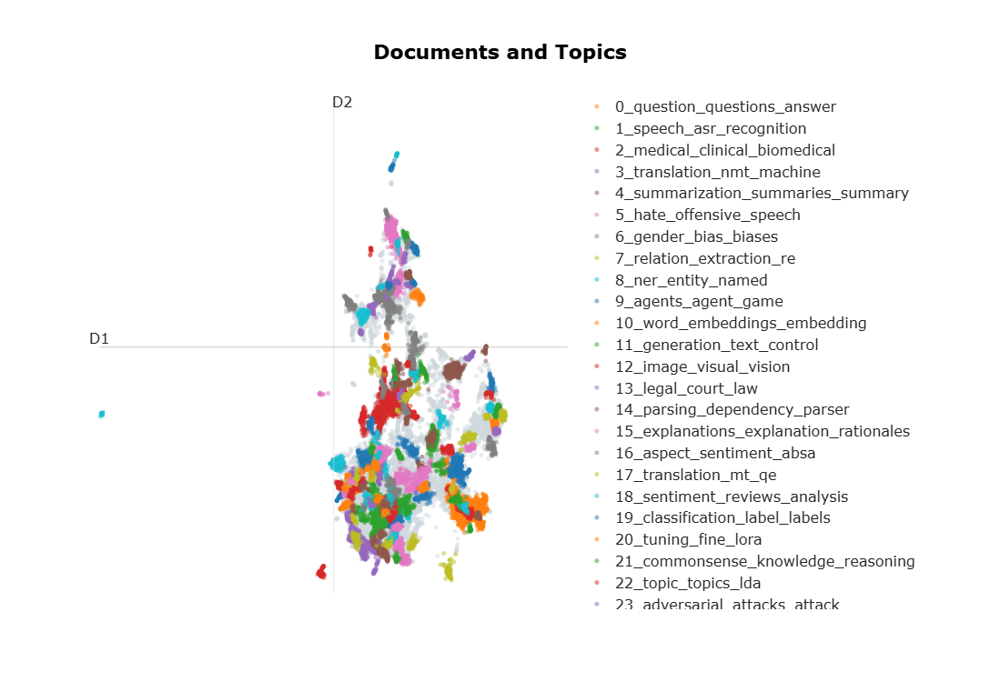

In [28]:
# Visualize topics and documents
fig = topic_model.visualize_documents(
    titles,
    reduced_embeddings=reduced_embeddings,
    width=1200,
    hide_annotations=True
)

# Update fonts of legend for easier visualization
fig.update_layout(font=dict(size=16))

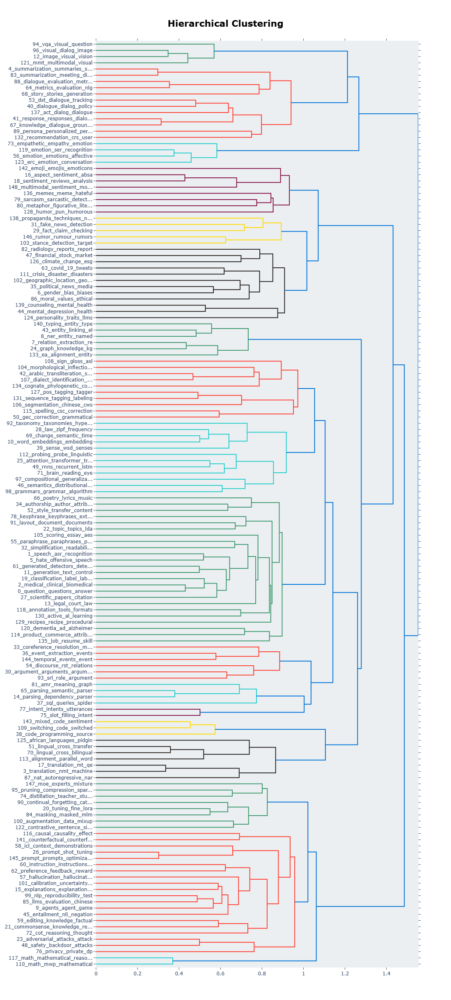

In [31]:
# Visualize barchart with ranked keywords
# topic_model.visualize_barchart()

# Visualize relationships between topics
# topic_model.visualize_heatmap(n_clusters=30)

# Visualize the potential hierarchical structure of topics
topic_model.visualize_hierarchy()